# Statement of the problem

The goal is to build a framework to study some discrete nonlinear dynamical systems and their chaotic behaviour from a numerical point of view, using the Julia Programming Language. I will

1. apply this framework to the logistic map: $x_{n+1}=4r(1-x_n)x_n$ as a test case;
2. study two alternative unimodal maps: the tent map, and the sine map. Observe similarities and differences;
3. verify which of these characteristics are preserved in the case of a non-unimodal map: I will test a bimodal map which I will construct as two side-by-side copied of the logistic map.


**Notes:**
1. Throughout this notebook I will not provide a numerical error associated to the estimates I will produce. This is not because of inattention, but because the quantities of which I provide estimates have a sharp dependency on many parameters which is very difficult to characterize analytically. A precise numerical study of these dependencies could provide insight and perhaps a valid estimate of the numerical error, but would require computational resources that go beyond my current possibilities. I chose not to concentrate on those aspects, since the effort would, in my opinion, highly exceed the value of the result. I will however discuss some of these dependencies from a qualitative point of view, thus pointing out the direction in which a more precise study could move on.

2. The visualizations of the bifurcation diagrams are shown in a lightweight version, where non-periodical orbits are not included. To achieve more visually appealing and resource-intensive representations, set the `include_non_periodic` keyword argument to `true`, or delete it altogether, since its default value is `true`. See the last section for some pictures of the results.

3. The `Lyapunov_average` function implements two different ways of computing the Lyapunov exponent, accessible through the `mode` keyword argument: the `"numerical"` mode is based on the formula:
   $$
   \lambda = \lim_{n\to\infty}\frac 1n\sum_{i=0}^{n-1}\ln\left|\frac{\Delta x_{i+1}}{\Delta x_i}\right|,
   $$
   while the `"analytical"` mode relies on the analytical calculation of the derivative of the map, through the formula:
   $$
   \lambda = \lim_{n\to\infty}\left(\frac{1}{n}\sum_{i=0}^{n-1}\ln|f'(x_i)|\right).
   $$
   These limits are true only for convergence to periodic orbits, but they can be extended to chaotic orbits with some limitations. 
   
   While the `"numerical"` mode is more flexible, it has the disadvantage that the computation of the Lyapunov exponent has to be optimized differently for the case of periodic orbits (where exponential convergence is best represented on the long run) vs chaotic ones (where exponential divergence is only realistic in the first steps due to fact that the orbit itself is limited). 
   
   The `"analytical"` mode, on the other hand, has the disadvantage that each map has to be implemented along with its analytical derivative, but the advantage is that, since derivatives are oblivious of the orbit's limitedness, the implementation is stable for long orbits, including chaotic ones. 
   
   The basic implementation I propose is unable to handle the difficulties of the numerical case in an efficient way, so I chose to use the analytical method throughout this notebook.


# Basic functions

The functions to compute relevant quantities regarding the dynamical systems are defined and implemented in a separate file to keep this one more readable. They are imported through the Julia module system and their documentation is still accessible:

In [1]:
(@isdefined LogisticMaps) || include("..\\src\\logistic_maps.jl") # Only import the module once, otherwise there will be conflicts
using .LogisticMaps

In [2]:
?LogisticMaps.maps #The dictionary is not exported, so we must reference it with the module name

Dictionary containing all the available maps.

Implemented keys: "logistic", "tent", "sine", "bimodal".


In [3]:
?logistic_map #The function is exported, so its name is available for direct use

search: logistic_map



```
logistic_map(x₀, r, N_steps; map="logistic")
```

Run the dynamical system associated to a `map` from [`maps`](@ref) (defaults to `"logistic"`), starting from point `x₀`, with parameter `r`, for `N_steps` discrete steps.  Return a vector containing all visited positions.


# Test Case: Logistic Map

## Convergence at equilibrium

We can analytically compute that, for $r=1/3$ and $r=1/2$, the points $x=1/4$ and $x=1/2$ will respectively be equilibrium points. We can see numerically that they are stable:

In [4]:
using Random
using Plots

r₁= 1/3
x₀₁= rand(MersenneTwister(1233), 10) .* .74 .+ 1/4

r₂ = .5
x₀₂= rand(MersenneTwister(1233),10) .* .49 .+ 1/2;

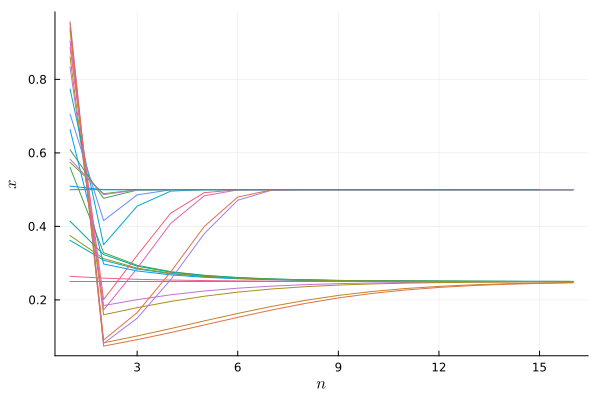

[ Info: Saved animation to d:\Università\Magistrale\Computazionale\esame\tmp.gif


Plots.AnimatedGif("d:\\Università\\Magistrale\\Computazionale\\esame\\tmp.gif")
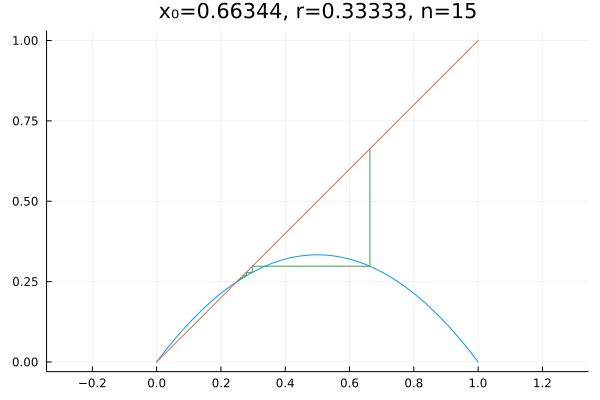

In [5]:
p = plot(legend=false, xlabel="\$n\$", ylabel="\$x\$")
map(x-> plot!(p,x), vcat(logistic_map.(x₀₁, r₁, 15), logistic_map.(x₀₂, r₂, 15)))
plot!(1:15, ones(15) * 1/4)
plot!(1:15, ones(15) * 1/2)

display(p)

@gif for x in x₀₁ 
    draw_cobweb(logistic_map(x, r₁, 15),r₁)
end fps = 5

## Fixed points and periodic orbits

We can study the presence of stable equilibrium points or periodic orbits and plot them as a function of the parameter $r$:

In [6]:
points = vcat([fixed_points_as_tuples(r, n=1000, map="logistic", include_non_periodic=false) for r in 0.2:.0005:1]...);

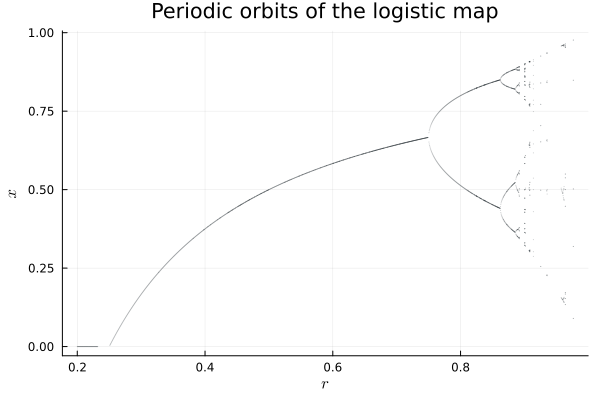

In [7]:
using Plots
using InspectDR
plt = scatter(points, ms=.2, ma=.2, title="Periodic orbits of the logistic map", legend=false,xlabel="\$r\$", ylabel="\$x\$")

We can see that the stable equilibrium point, initially at $x=0$, shifts to higher values ($x=0$ remains an unstable equilibrium point), until it starts following a bifurcation pattern that quickly leads to chaos, interrupted by isolated windows of stable equilibrium which quickly undergo bifurcation with the same pattern. 

The succession of multiplicities of stable equilibrium points looks highly unpredictable: stability regions have highly irregular extensions, so there is no hope of thoroughly characterizing their succession with simple numerical methods. Bifurcation is poorly described by the actual measured periodicity of the system, as can be seen in following plot: numerical errors easily lead to single points being counted twice. We can resort to the Lyapunov exponent as a tool to study this situation.

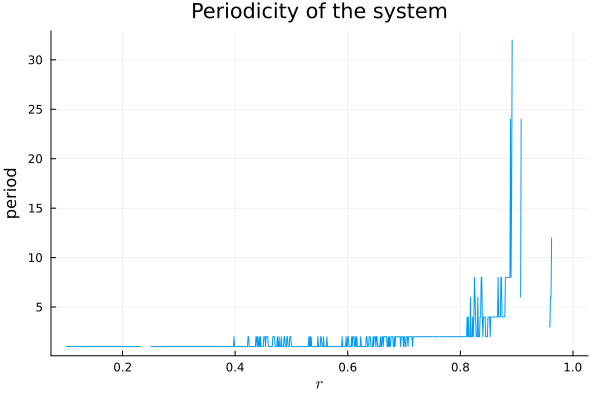

In [8]:
using Plots
plot(0.1:0.001:1, find_period.(0.1:0.001:1) .|> x-> x[1], legend=false, ylabel = "period", xlabel="\$r\$", title = "Periodicity of the system")

## Lyapunov exponents and bifurcation points

To characterize the chaos of the dynamical system, we can compute the Lyapunov exponent as a function of the parameter $r$:

In [9]:
δr = .0002
r_range = 0.2:δr:1
exponents = map(r -> Lyapunov_average(0.1:.001:.99, r, start=10, map="logistic"), r_range);

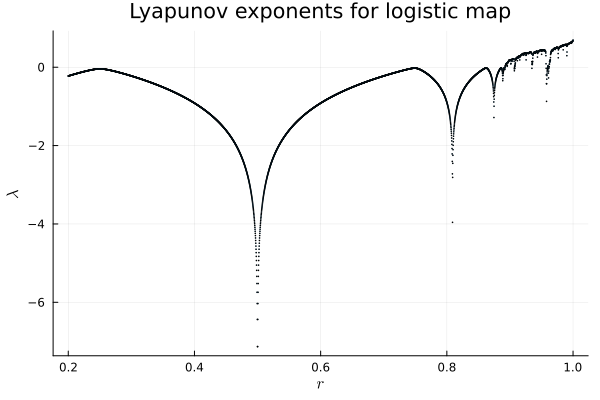

In [10]:
scatter(r_range, exponents, ms=.5, xlabel="\$r\$", ylabel="\$\\lambda\$", legend=false, title= "Lyapunov exponents for logistic map")

As the Lyapunov exponent approaches $0$, the stability of the equilibrium points or periodic orbits weakens. This suggests that the presence of peaks in the negative regions of Lyapunov exponents correspond to bifurcation points. We can detect these peaks by numerical methods, and thus calculate the position of the bifurcation points with some desired precision $\delta r$. We wrap everything up into a function so that we can use it also for other maps:

In [11]:
function findnegativelocalmaxima(array; ε=0.)
    result=[]
    for i in eachindex(array)[begin+1:end-1]
        if array[i-1] ≤ array[i] ≥ array[i+1] && array[i] ≤ ε
            push!(result, i)
        end
    end
    result
end

"Study the bifurcation points of the dynamical system, and plot them against"
function study_bifurcations(exponents, r_range, plt; ε=0)
    #Copy the fixed points' plot
    plt2=plot(plt)

    bifurcation_points = r_range[findnegativelocalmaxima(exponents, ε=ε)]
    for r in bifurcation_points
        plot!(plt2, [(r,0),(r,1)], label=false)
    end
    display(plt2)
    return bifurcation_points
end

study_bifurcations

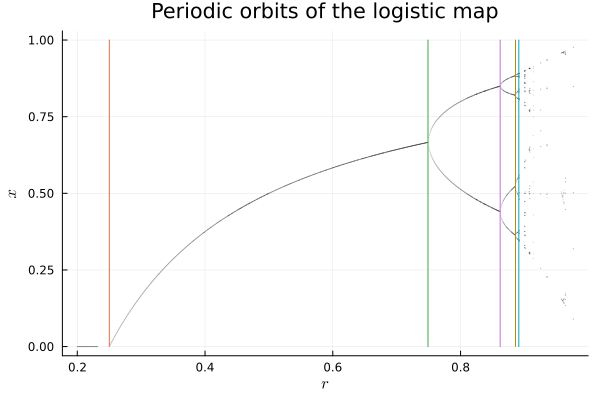

5-element Vector{Float64}:
 0.2502
 0.749
 0.862
 0.886
 0.8912

In [12]:
bifurcation_points = study_bifurcations(exponents, r_range, plt)

This method works well at least for the first five bifurcation points (the first one arguably being a true bifurcation point). Note that numerical noise in the Lyapunov exponents may translate into artifacts in the calculations of the local maxima due to spurious oscillations. Therefore, an increase in the precision of the bifurcation point's localization (smaller $\delta r$) must correspond to an increase in the number of paths on which the Lyapunov exponent is averaged. I found that a value of $\delta r= 2\cdot 10^{-4}$ gives the optimal compromise between speed and precision. Smaller values (e.g. $\delta r= 1\cdot 10^{-4}$) cause artifacts or require more paths for the Lyapunov average. 

However, $\delta r$ does not represent the true numerical error on the bifurcation points, since the calculated values for the exponents significantly depend also on the `start` and `stop` parameters, and in some measure on the distribution of initial points, which I arbitrarily fix to a uniform distribution. Unless we were to thoroughly explore the space of these parameters, we must take our results with a grain of salt.

I wasn't able to calculate the position of the sixth bifurcation point with any reasonable choice of parameters. This makes sense since the distance between bifurcation points decreases roughly exponentially, requiring exponentially more resources to locate successive maxima. We can start seeing this exponential trend already from the first points (again, the values I will compute have demonstration purposes only, but a serious characterization of the error on the positions of the bifurcation points could easily be propagated up to the final number I will provide):

In [13]:
# Compute the distances between bifurcation points
lengths = diff(bifurcation_points)

# Semilog plot of the distances
scatter(lengths, yscale=:log10, ylabel="distances", label = "distances")

# Find the exponent by linear fit on the logarithm
using EasyFit
fit = fitlinear(1:4,log.(lengths))

------------------- Linear Fit -------------

Equation: y = ax + b

With: a = -1.5239973753022067
      b = 0.8438145313869282

Pearson correlation coefficient, R = 0.9999632568873511
Average square residue = 0.00021335770320740933

Predicted Y: ypred = [-0.6801828439152785, -2.204180219217485, ...]
residues = [0.015367221260977115, -0.02381275894768864, ...]

--------------------------------------------


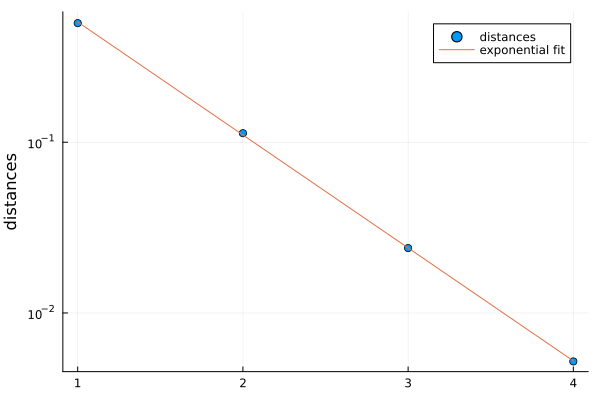

The ratio of successive distances is: 4.590538673750961


In [14]:
display(plot!([(1, exp(fit.a+fit.b)),(4,exp(4fit.a+fit.b))], label = "exponential fit"))

println("The ratio of successive distances is: $(exp(-fit.a))")

# Other unimodal maps

We study two additional unimodal maps: the sine map,
$$
x_n = r \sin(\pi x)
$$
and the tent map,
$$
x_n = \begin{cases}2r x & 0\leq x \leq 0.5\\ 2r(1 - x) & 0.5<x\leq 1.\end{cases}
$$
Note that we redefined the classical tent map with a factor of $2$, so that for all maps the range for $r$ is $(0,1)$. Let us carry on the same study as for the logistic map, and spot any similarities or differences between the three cases.

In [15]:
points_sine = vcat([fixed_points_as_tuples(r, n=1000, map="sine", include_non_periodic=false) for r in 0.7:.0002:1]...);
points_tent = vcat([fixed_points_as_tuples(r, n=1000, map="tent", include_non_periodic=false) for r in 0.1:.005:1]...);

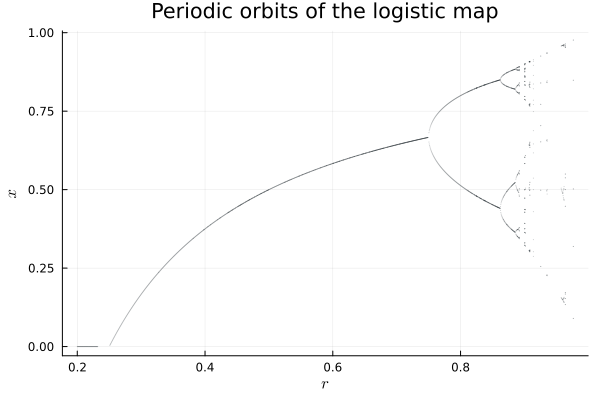

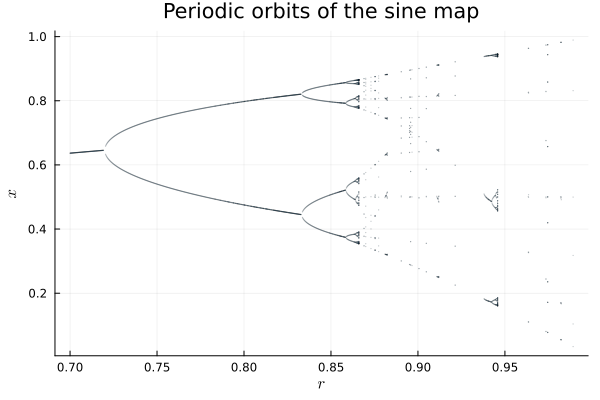

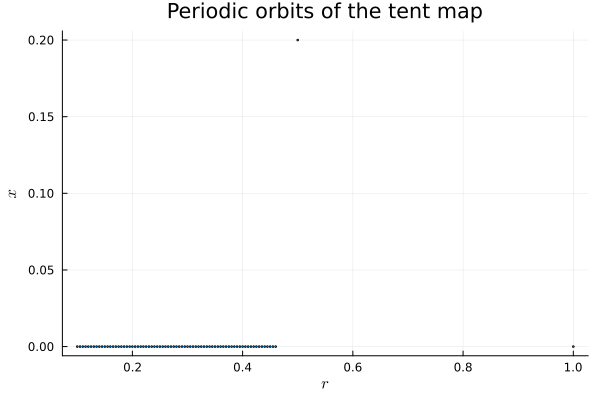

In [16]:
using Plots
using InspectDR
display(plt)
plt_sine = scatter(points_sine, ms=.3, ma=.2, title="Periodic orbits of the sine map", xlabel="\$r\$", ylabel = "\$x\$", legend=false)
plt_tent = scatter(points_tent, ms=1, title="Periodic orbits of the tent map", xlabel="\$r\$", ylabel = "\$x\$", legend=false)

display(plt_sine)
display(plt_tent)

As for similarities, we immediately see that all three maps have a region where $x=0$ is a stable equilibrium point. This equilibrium then shifts towards a higher value before bifurcation occurs. 

In the case of the sine map, there is an incredible resemblance to the logistic map. The bifurcation diagram indeed looks like a deformed version of the logistic map's diagram. The same regions of stability and chaos are present and the bifurcation pattern appears identical.

In the case of the tent map, though, there seems to be no bifurcation at all, and, after a discontinuous shift of the equilibrium point away from $x=0$, no equilibrium is found at all.

These observations can be seen more clearly through the Lyapunov exponents:

In [17]:
exponents_sine = map(r -> Lyapunov_average(0.1:.001:.99, r, start=10, map="sine"), r_range);
exponents_tent = map(r -> Lyapunov_average(0.1:.01:.99, r, map="tent"), 0.1:.005:1);

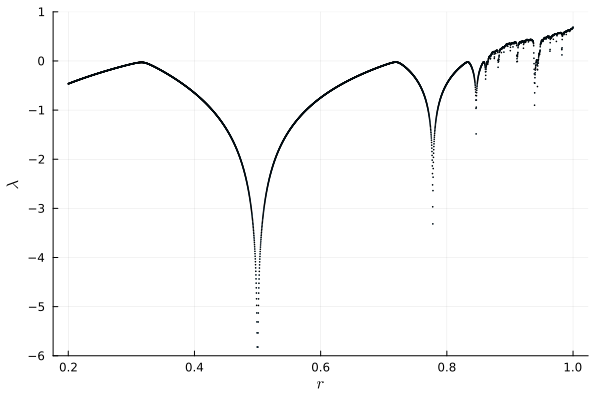

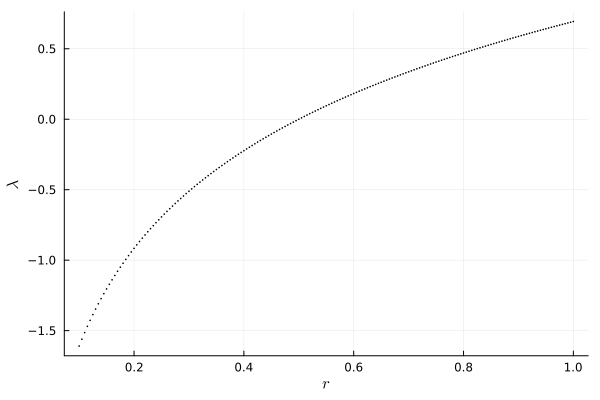

In [18]:
using Plots
display(scatter(r_range, exponents_sine, ms=.5, xlabel="\$r\$", ylabel = "\$\\lambda\$", legend=false, ylims=(-6,1)))
display(scatter(0.1:.005:1, exponents_tent, ms=.5, xlabel="\$r\$", ylabel = "\$\\lambda\$", legend=false))

The tent map shows no local maxima for the Lyapunov exponent in the negative region, indicating the absence of bifurcation. On the other hand, the sine map shows again the same pattern as the logistic map. By studying the bifurcation points, we can see that, though their position and difference varies from the logistic map, their distance decreases again exponentially, and with roughly the same exponent: it is like the bifurcation diagram was stretched while maintaining its proportions. This time, also the fifth bifurcation is found, and the exponential separation can be better viewed and quantified:

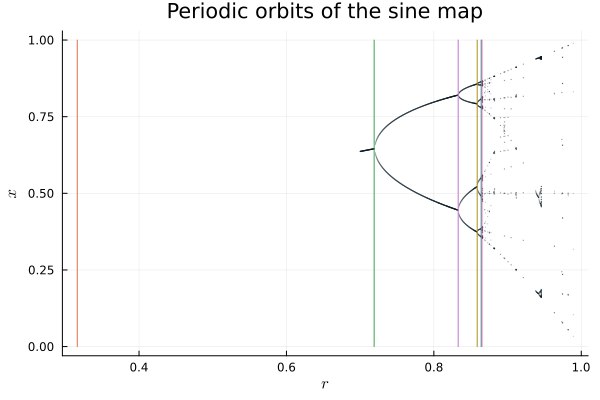

6-element Vector{Float64}:
 0.3162
 0.719
 0.833
 0.8588
 0.8642
 0.8652

In [19]:
bifurcation_sine = study_bifurcations(exponents_sine, r_range, plt_sine)

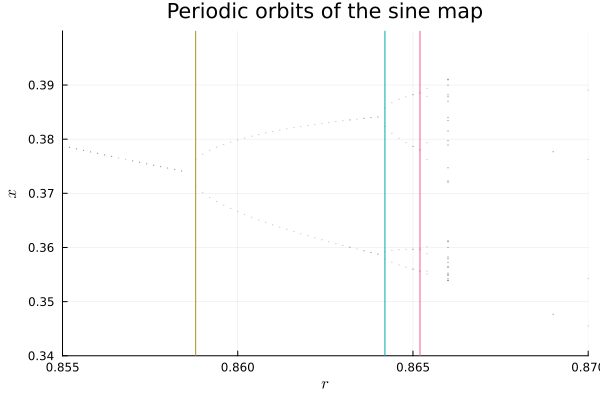

In [20]:
plot!(xlims=(.855,.87), ylims=(.34,.4))

In [21]:
lengths_sine = diff(bifurcation_sine)

# Semilog plot of the distances
scatter(lengths_sine, yscale=:log10, ylabel="distances", label = "distances")

# Find the exponent by linear fit on the logarithm
using EasyFit
fit_sine = fitlinear(1:5,log.(lengths_sine))


------------------- Linear Fit -------------

Equation: y = ax + b

With: a = -1.5046679816505182
      b = 0.7405310769157789

Pearson correlation coefficient, R = 0.998614926872471
Average square residue = 0.012569473249220354

Predicted Y: ypred = [-0.7641369047347393, -2.2688048863852575, ...]
residues = [0.14517821340299053, -0.09724805579761586, ...]

--------------------------------------------


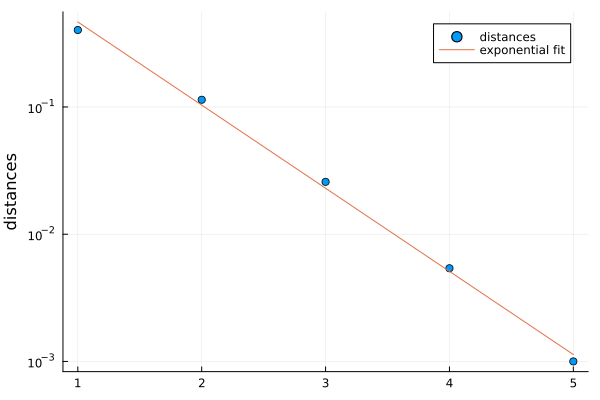

The ratio of successive distances is: 4.502658416867225


In [22]:
display(plot!([(1, exp(fit_sine.a+fit_sine.b)),(5,exp(5fit_sine.a+fit_sine.b))], label = "exponential fit"))

println("The ratio of successive distances is: $(exp(-fit_sine.a))")

**Note:** for the bifurcation process, the sequence of the ratios between successive distances [has been proven](https://en.wikipedia.org/wiki/Feigenbaum_constants) to have the same limit for all unimodal maps, a limit which is called the *first Feigenbaum constant*:
$$
\delta = 4.669201\dots
$$
In other words, the points in the previous plot asyntotically tend to align on a straight line whose negative pendence is the logarithm of the first Feigenbaum constant, and this holds for all maps. Since the tent map shows no bifurcation, it can somehow be regarded as a degenerate case.


# Bimodal map

I will now investigate the case of a bimodal map, i.e. a map which has two maxima. The map I chose is given by the law:
$$
x_{n+1} = \begin{cases}4r (1-2x_n)\cdot 2x_n & x_n\leq 1/2\\ 4r(1-(2x_n-1))\cdot(2x_n-1) & x_n > 1/2.\end{cases}
$$
Intuitively, it is a logistic map repeated twice.

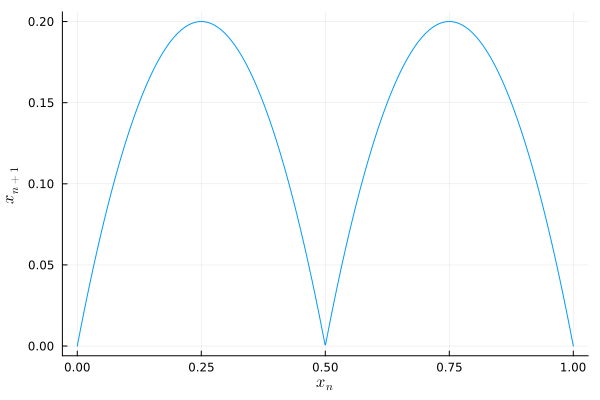

In [23]:
plot(range(0,1,1000),LogisticMaps.maps["bimodal"].(range(0,1,1000),.2), legend=false, xlabel="\$x_n\$", ylabel="\$x_{n+1}\$")

The first thing to look at are periodic orbits:

In [24]:
points_bimodal = vcat([fixed_points_as_tuples(r, n=1000, map="bimodal", include_non_periodic=false) for r in 0.01:.001:1]...);

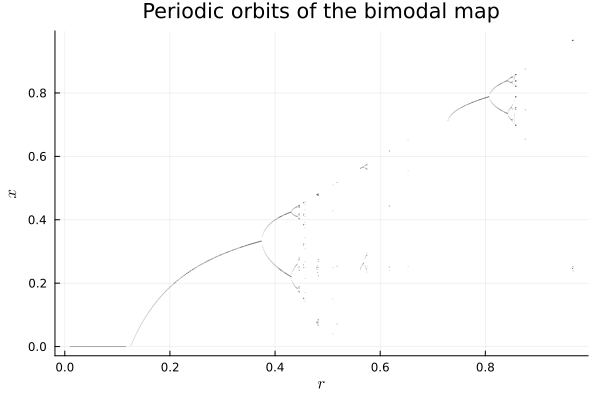

In [25]:
using Plots
using InspectDR
plt_bimodal = scatter(points_bimodal, ms=.2, ma=.2, title="Periodic orbits of the bimodal map", xlabel="\$r\$", ylabel = "\$x\$", legend=false)

What appears is a somewhat unexpected result: the bimodal map behaves exactly the same way as the unimodal logistic map for values of $r\in(0,1/2)$, which makes sense since in that interval one can map $x\mapsto y=2x$ and $r\mapsto s=2r$ and obtain the same form as the logistic map with half the domain both in $x$ and $r$. The second part, though, shows an initial chaotic region, with some small regularity windows, followed by a strong return to a single point stability, with bifurcations occurring at a rather slow pace. Afterwards, instability rules again. 

I shall compare the two stability regions. Since it is analytically clear that the first region is identical to the logistic map case, I shall only study the second region. I will focus on the Feigenbaum constant, and test whether it is the same as the one for unimodal maps.


In [ ]:
bimodal_range = 0.8:.0001:.86
exponents_bimodal = map(r -> Lyapunov_average(0.1:.00005:.99, r, map="bimodal"), bimodal_range);

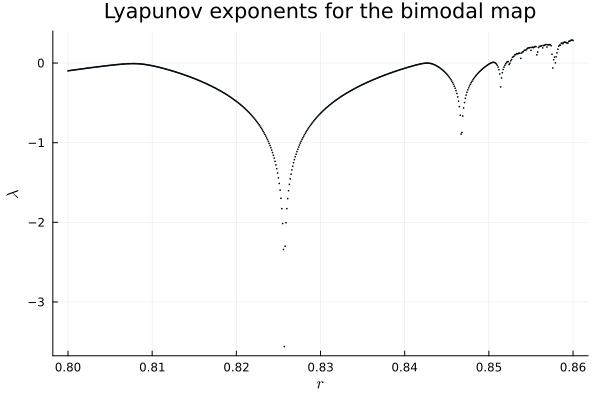

In [27]:
using Plots
display(scatter(bimodal_range, exponents_bimodal, ms=.5, xlabel="\$r\$", ylabel="\$\\lambda\$", legend=false, title="Lyapunov exponents for the bimodal map"))

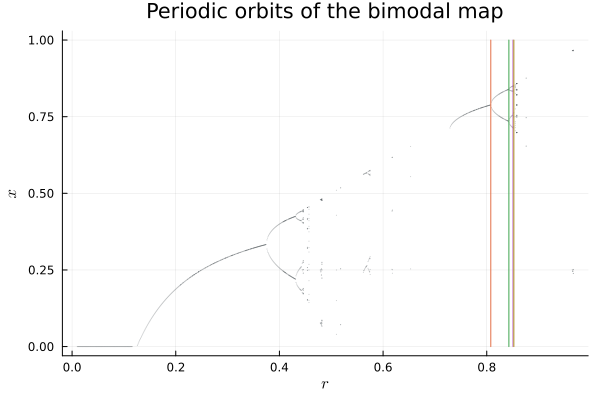

4-element Vector{Float64}:
 0.8078
 0.8427
 0.8505
 0.8523

In [28]:
bifurcation_bimodal = study_bifurcations(exponents_bimodal, bimodal_range, plt_bimodal, ε=.02)

In [29]:
lengths_bimodal = diff(bifurcation_bimodal)

# Semilog plot of the distances
scatter(lengths_bimodal, yscale=:log10, ylabel="distances", label = "distances")

# Find the exponent by linear fit on the logarithm
using EasyFit
fit_bimodal = fitlinear(1:3,log.(lengths_bimodal))

------------------- Linear Fit -------------

Equation: y = ax + b

With: a = -1.4823500821529692
      b = -1.8782560387408944

Pearson correlation coefficient, R = 0.99998055174463
Average square residue = 5.698146596826675e-5

Predicted Y: ypred = [-3.3606061208938636, -4.842956203046833, ...]
residues = [-0.005337671120109189, 0.010675342239754748, ...]

--------------------------------------------


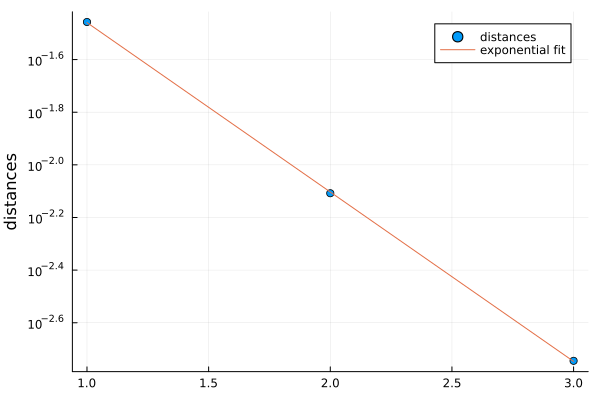

The ratio of successive distances is: 4.403281604540255


In [30]:
display(plot!([(1, exp(fit_bimodal.a+fit_bimodal.b)),(3,exp(3fit_bimodal.a+fit_bimodal.b))], label = "exponential fit"))

println("The ratio of successive distances is: $(exp(-fit_bimodal.a))")

which, as far as we can tell, could be in good accordance with the Feigenbaum constant for unimodal maps. If this were true, there could be a transformation, affine in $r$ so as to preserve proportions, that could recover the form of the logistic map in this interval of stability. Unfortunately, I was unable to find an expression for such a transformation.

# Additional images

Here are some images that I generated with my code, that I find visually appealing and, in some way, helpful to understand what is going on. I chose to put them here because they were either too computationally intensive to include in the code, or because they would have interrupted the line of reasoning of the notebook.

## Logistic map

![[logistic map]](../images/unimodal.png) ![](../images/logistic_zoom.png)

## Tent map

![](../images/tent.png)

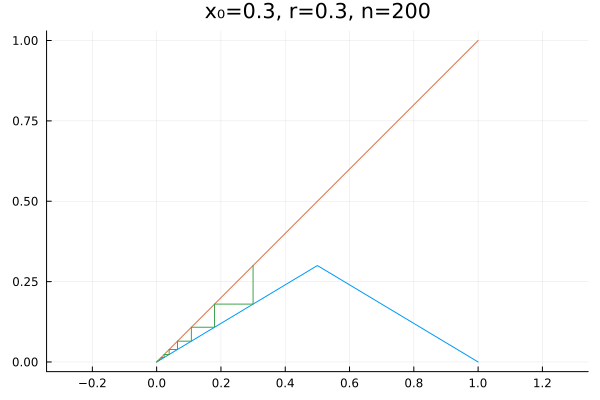

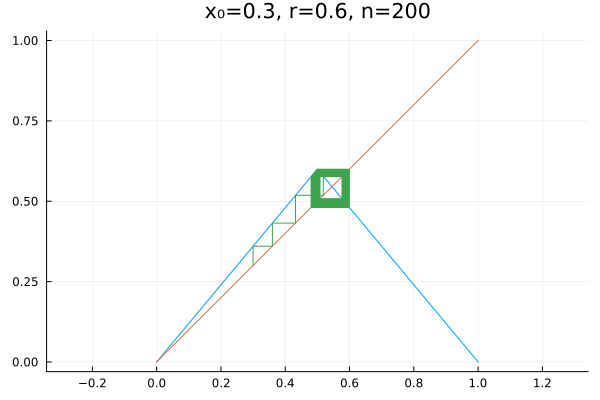

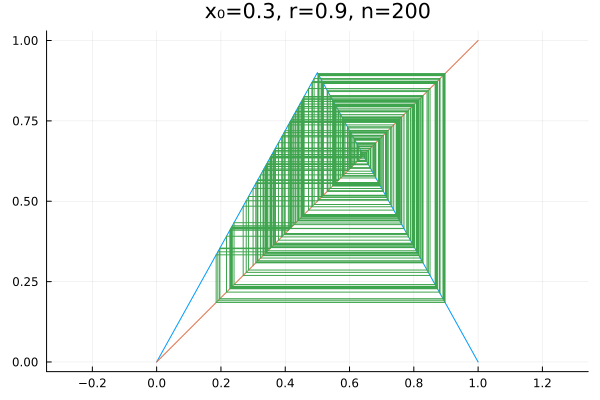

In [31]:
display.(
    draw_cobweb.(
        map(
            r -> logistic_map(.3, r,200, map="tent"), 
            [.3,.6,.9]
            ),
        [.3,.6,.9],
        start=1, map="tent"
        )
    );

## Sine map

![](../images/sine.png) ![](../images/sine_zoom.png)

## Bimodal map

![](../images/bimodal.png) ![](../images/bimodal_zoom.png)